In [1]:
import sys
import os
import numpy as np
import pandas as pd

from tqdm import tqdm
import numba
import datetime

In [2]:
vor_path = "/home/ubuntu/git/active_vertex"
# vor_path = 'C:\\Users\\Pranav\\git\\active_vertex'
sys.path.append(vor_path)

import voronoi_model.voronoi_model_periodic as avm

In [3]:
@numba.njit
def get_D_eff(X0, Xmax, L, tmax, v0, Dr, n=19):
    
    X0_norm = X0 - L/2
    center_cells = np.argsort(np.sqrt(X0_norm[:, 0]**2 + X0_norm[:, 1]**2))[:n]
    
    dX = np.fmod(Xmax[center_cells] - X0[center_cells], L/2)
    dr2 = np.zeros(n, dtype=np.float32)
    for i in range(n):
        dr2[i] = dX[i, 0] ** 2 + dX[i, 1] ** 2
    
    Ds = dr2.mean() / (4*tmax)
    D0 = v0**2/(2*Dr)
    return Ds / D0

def vor_to_D_eff(vor, n=7):
    return get_D_eff(
        vor.x_save[0],
        vor.x_save[-1],
        vor.L,
        vor.tfin,
        vor.v0,
        vor.Dr,
        n=n,
    )

In [4]:
# p_space = np.linspace(3.5, 3.9, 11)
# v_space = np.linspace(2e-3, 3e-2, 8)
# replicates = np.arange(3, dtype=int)

# param_space = np.meshgrid(
#     p_space,
#     v_space,
#     replicates
# )
# param_space = np.array(param_space).T.reshape(-1, 3)

In [38]:
f = 200
t0 = 0
tmax = 2
dt = 0.05
n_t = int((tmax - t0) * f / dt) + 1  # calculates the n_t to get the desired dt

# a = 0.4
k = 2
J = 0.

In [39]:
to_dir = "/home/ubuntu/git/evomorph/data/2020-09-16_avm_phase_sims/"

if not os.path.exists(to_dir):
    os.mkdir(to_dir)

In [40]:
def simulate(params, progress_bar=False, print_updates=False):
    p, v, rep = params
    prefix = f"p0{p:.2f}_v0{v:.2e}_rep{int(rep)}"
    
    vor = avm.Tissue()
    vor.make_init2(L=10, n_c=400)
    
    print("Init done.")
    
    vor.set_GRN_t_span(t0, tmax, n_t, scaling_factor=f);
    vor.v0 = v
    vor.n_warmup_steps = int(150 / dt)
#     vor.n_warmup_steps = 1

    W = J * np.array([[1, 0], [0, 1]])
    vor.set_interaction(W=W, pE=0)
    vor.A0 = vor.L**2 / vor.n_c
    vor.P0 = p * np.sqrt(vor.A0)
    
    vor.Dr = 0.01
    vor.kappa_A = 0.2
    vor.kappa_P = 0.1
    vor.a = vor.A0 / 2
    vor.k = k

    vor.simulate(progress_bar=progress_bar, print_updates=print_updates)
    
    return vor

In [46]:
p0 = 3.85
v0 = 0
rep = 0
params = p0, v0, rep

vor = simulate(params, progress_bar=True, print_updates=True)

Init done.
Warming up SPV (3000 steps)


100%|██████████| 8000/8000 [03:12<00:00, 41.60it/s]


In [47]:
vor.x_save[::1000].shape

(9, 400, 2)

<hr>

In [48]:
import holoviews as hv
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [49]:
# Save subset of data for plotting
data = pd.DataFrame(dict(
    X_coord = vor.x_save[::1000, :, 0].ravel(),
    Y_coord = vor.x_save[::1000, :, 1].ravel(),
    step = np.repeat(np.arange(vor.x_save.shape[0])[::1000], vor.x_save.shape[1], axis=0),
#     expression = vor.E_save[::1000].ravel(),
))
# data["time"] = data["step"] * metadata["dt"] / metadata["f"]
data["time"] = data["step"] * dt / f

data.head().append(data.tail())    

,X_coord,Y_coord,step,time
0,0.399461,0.179285,0,0.0
1,0.341225,0.749547,0,0.0
2,0.191613,1.249855,0,0.0
3,0.402452,1.705863,0,0.0
4,0.193941,2.217092,0,0.0
3595,9.829745,8.283010,8000,2.0
3596,9.625431,8.755822,8000,2.0
3597,9.854953,9.306704,8000,2.0
3598,9.564543,9.837578,8000,2.0
3599,9.856109,0.265508,8000,2.0


:NdLayout   [time]
   :Points   [X_coord,Y_coord]   (time)
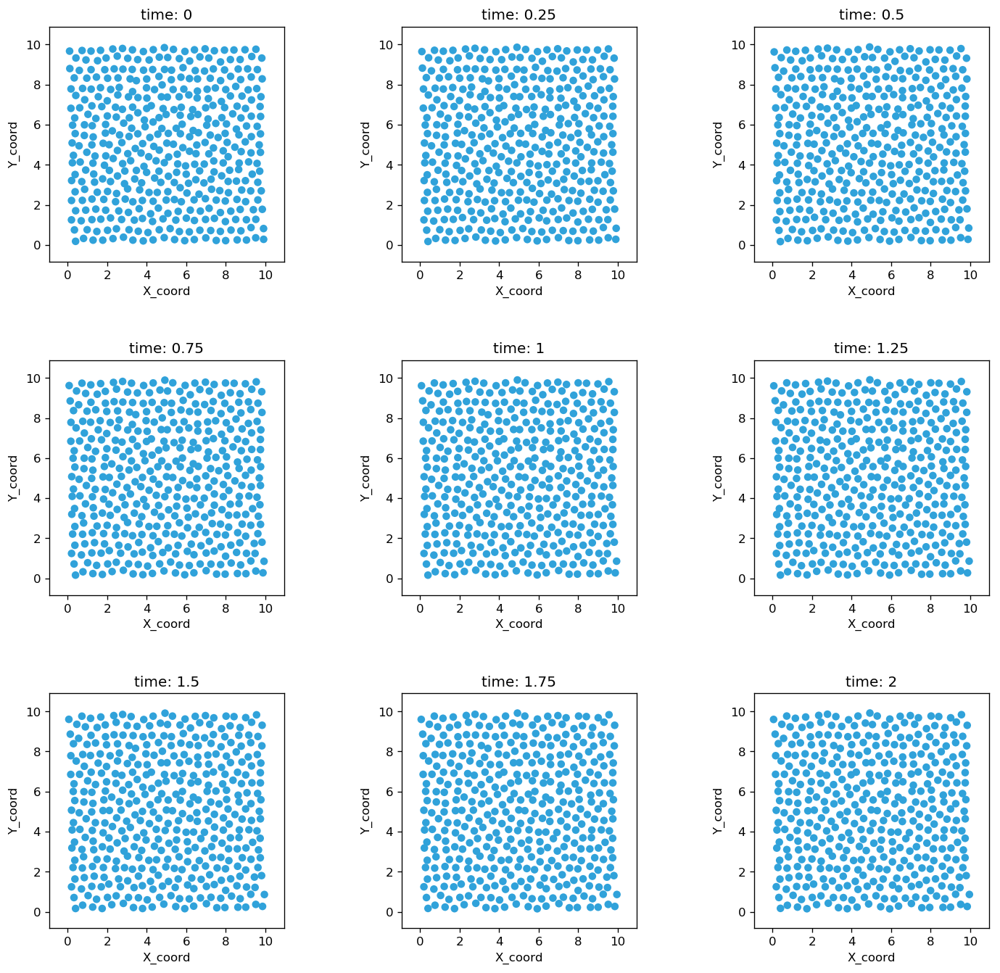

In [50]:
# PLot as scatterplot, colored by expression
plt = hv.Points(
    data, 
    kdims=['X_coord', 'Y_coord'], 
    vdims=['time'],
).groupby(
    'time'
).opts(
    padding=0.1, 
    s=40, 
#     color='expression', 
#     cmap=cc.kgy,
#     colorbar=True,
).layout().cols(3)

hv.output(plt, dpi=120)

In [1]:
import sys
import os
import numpy as np
import pandas as pd

from tqdm import tqdm
import numba
import datetime

vor_path = "/home/ubuntu/git/active_vertex"
# vor_path = 'C:\\Users\\Pranav\\git\\active_vertex'
sys.path.append(vor_path)

import voronoi_model.voronoi_model_periodic as avm

########################

In [2]:
@numba.njit
def get_D_eff(X0, Xmax, L, tmax, v0, Dr, n=19):
    
    X0_norm = X0 - L/2
    center_cells = np.argsort(np.sqrt(X0_norm[:, 0]**2 + X0_norm[:, 1]**2))[:n]
    
    dX = np.fmod(Xmax[center_cells] - X0[center_cells], L/2)
    dr2 = np.zeros(n, dtype=np.float32)
    for i in range(n):
        dr2[i] = dX[i, 0] ** 2 + dX[i, 1] ** 2
    
    Ds = dr2.mean() / (4*tmax)
    D0 = v0**2/(2*Dr)
    return Ds / D0

def vor_to_D_eff(vor, n=7):
    return get_D_eff(
        vor.x_save[0],
        vor.x_save[-1],
        vor.L,
        vor.tfin,
        vor.v0,
        vor.Dr,
        n=n,
    )


def pcounter(n):
    i = 1
    while True:
        yield i/n
        i += 1

########################

# p_space = np.linspace(3.5, 4.0, 11)
# v_space = np.linspace(2e-3, 3e-2, 15)
# replicates = np.arange(5, dtype=int)

p_space = np.linspace(3.5, 3.9, 3)
v_space = np.linspace(2e-3, 3e-2, 5)
replicates = np.arange(1, dtype=int)

param_space = np.meshgrid(
    p_space,
    v_space,
    replicates
)
param_space = np.array(param_space).T.reshape(-1, 3)

########################

f = 200
t0 = 0
tmax = 1
dt = 0.025
n_t = int((tmax - t0) * f / dt) + 1  # calculates the n_t to get the desired dt

# a = 0.4
k = 2
J = 0.

common_metadata = dict(f=f, t0=t0, tmax=tmax, dt=dt, n_t=n_t, k=k, J=J)

to_dir = "2020-09-17_avm_phase_sims/"

if not os.path.exists(to_dir):
    os.mkdir(to_dir)

cores = 8
gen = pcounter((param_space.shape[0] // cores) + 1)

def count():
    return next(gen)

In [3]:
def simulate(params, progress_bar=False, print_updates=False):
    p, v, rep = params
    rep = int(rep)
    prefix = f"p0{p:.2f}_v0{v:.2e}_rep{rep}"
    
    vor2 = avm.Tissue()
    vor2.make_init2(L=10, n_c=250)
    
    vor2.set_GRN_t_span(t0, tmax, n_t, scaling_factor=f);
    vor2.v0 = v
    vor2.n_warmup_steps = int(50 / dt)
#     vor2.n_warmup_steps=1

    W = J * np.array([[1, 0], [0, 1]])
    vor2.set_interaction(W=W, pE=0)
    vor2.A0 = vor2.L**2 / vor2.n_c
    vor2.P0 = p * np.sqrt(vor2.A0)
    
    vor2.Dr = 0.01
    vor2.kappa_A = 0.2
    vor2.kappa_P = 0.1
    vor2.a = vor2.A0 / 2
    vor2.k = k
    
    vor2.simulate(progress_bar=progress_bar, print_updates=print_updates);
    
    fname = to_dir + prefix + ".npy"
    np.save(fname, vor2.x_save, allow_pickle=False)
    
    print(f"Thread {count()*100:.2f}% complete")

#     return vor2, prefix, [vor_to_D_eff(vor2, n) for n in (7, 19, 37)]
    return vor2.t_span, vor2.x_save, vor2.L

In [5]:
from multiprocessing import Pool
if __name__ == '__main__':
    with Pool(cores) as p:
        results = list(p.imap_unordered(simulate, param_space))

# vor, prefix, results = simulate((3.8, 0.2, 0), True, True)

Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 50.00% complete
Thread 100.00% complete
Thread 100.00% complete
Thread 100.00% complete
Thread 100.00% complete
Thread 100.00% complete
Thread 100.00% complete
Thread 100.00% complete


In [38]:
def get_res_D_eff(i, res, n):
    return get_D_eff(res[1][0], res[1][-1], 10, res[0][-1] , param_space[i, 1] , 0.01, n=n)


res_D_eff = np.zeros((len(results), 4), dtype=np.float32)
for i, res in enumerate(results):
    res_D_eff[i] = [get_res_D_eff(i, res, k) for k in (7, 19, 37, 61)]

In [39]:
res_D_eff

array([[2.96788067e-01, 4.32262838e-01, 4.50783968e-01, 4.50766772e-01],
       [1.50023606e-02, 2.35664211e-02, 2.28160135e-02, 2.17276812e-02],
       [5.90674952e-03, 1.27215255e-02, 1.40039530e-02, 1.38002839e-02],
       [4.44044825e-03, 1.20860403e-02, 1.56502649e-02, 1.57249793e-02],
       [2.85415701e-03, 5.94546786e-03, 6.06117025e-03, 5.79815824e-03],
       [1.13220409e-01, 1.68513373e-01, 1.74313396e-01, 1.68733150e-01],
       [4.05867863e-03, 6.21123053e-03, 4.92374040e-03, 4.68236813e-03],
       [8.64832255e-05, 1.59305971e-04, 1.78087968e-04, 1.83091179e-04],
       [2.05326304e-02, 2.54641175e-02, 3.11706290e-02, 2.75232792e-02],
       [2.39190999e-02, 3.31030153e-02, 3.41024399e-02, 3.22531722e-02],
       [1.67299902e+00, 1.68821156e+00, 1.65938413e+00, 1.52657962e+00],
       [2.47688517e-01, 2.69754618e-01, 3.13114852e-01, 2.81417608e-01],
       [2.62722701e-01, 3.02477866e-01, 4.08088803e-01, 3.72009844e-01],
       [1.02710433e-01, 1.03609078e-01, 9.04510692e

In [6]:
%matplotlib inline
import numpy as np
# import matplotlib.pyplot as plt

# from matplotlib import animation, rc
from IPython.display import HTML

In [40]:
i = 0

In [41]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.50
v0: 0.002


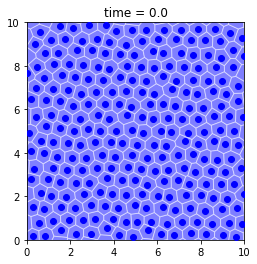

In [42]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [43]:
i = 1

In [44]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.50
v0: 0.009


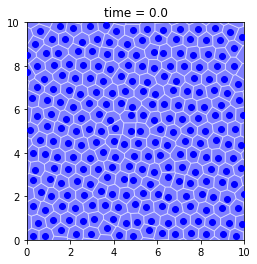

In [45]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [46]:
i = 2

In [47]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.50
v0: 0.016


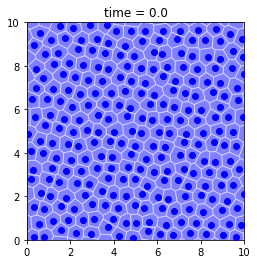

In [48]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [49]:
i = 3

In [50]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.50
v0: 0.023


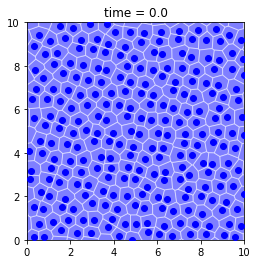

In [51]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [52]:
i = 4

In [53]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.50
v0: 0.030


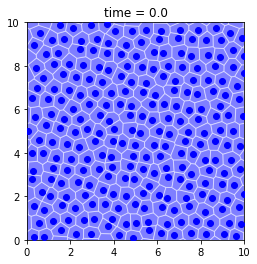

In [54]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [55]:
i = 5

In [56]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.70
v0: 0.002


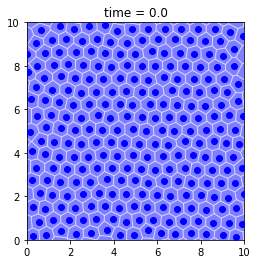

In [57]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [58]:
i = 6

In [59]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.70
v0: 0.009


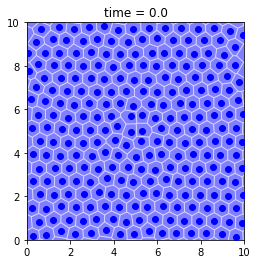

In [60]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [61]:
i = 7

In [62]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.70
v0: 0.016


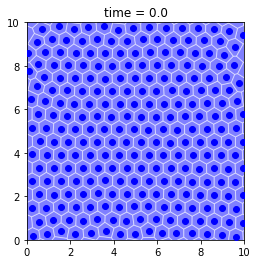

In [63]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [64]:
i = 8

In [65]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.70
v0: 0.023


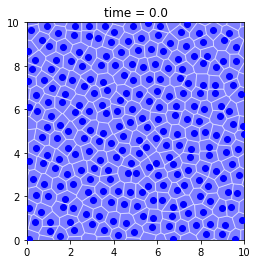

In [66]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [67]:
i = 9

In [68]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.70
v0: 0.030


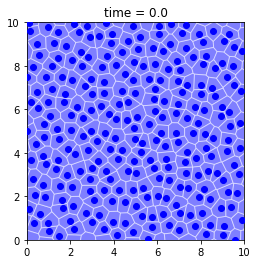

In [69]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [70]:
i = 10

In [71]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.90
v0: 0.002


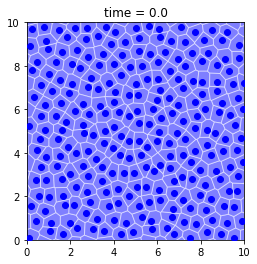

In [72]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [73]:
i = 11

In [74]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.90
v0: 0.009


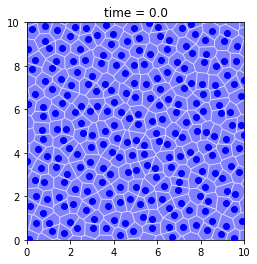

In [75]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [76]:
i = 12

In [77]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.90
v0: 0.016


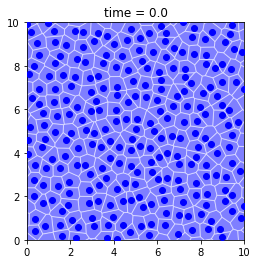

In [78]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [79]:
i = 13

In [80]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.90
v0: 0.023


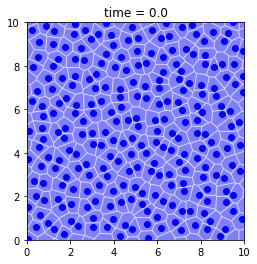

In [81]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [85]:
i = 14

In [86]:
vor = avm.Tissue()
vor.t_span, vor.x_save, vor.L = results[i]
vor.c_types = np.ones(vor.x_save.shape[1], dtype=int)

p0: 3.90
v0: 0.030


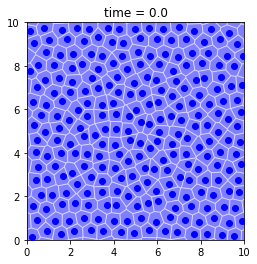

In [87]:
print("p0: {0:.2f}\nv0: {1:.3f}".format(*param_space[i]))
anim = vor.animate(n_frames=100, inline=True, interval=50)
HTML(anim.to_html5_video())

In [89]:
param_space[14]

array([3.9 , 0.03, 0.  ])